# Mouse snRNA Annotation
## Gastrocnemius

In [13]:
library(Matrix)
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(viridis))
library(RColorBrewer)
library(data.table)
options(future.globals.maxSize = 10000 * 1024^2)
future.seed=TRUE
source("plotting_functions.R")

In [14]:
system("mkdir ../../plots/")
system("mkdir ../../plots/qc")
system("mkdir ../../plots/clustering")
system("mkdir ../../plots/annotation")

In [15]:
tissue = "gastrocnemius"
abrv = "G"
synapse_id = "EAID_000088"
enc_abrv = "SKMU"
markers_tissue = "SkeletalMuscle"

# Read in data

In [16]:
obj = readRDS(paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))
obj$sample = factor(obj$sample, 
                    levels = paste0(abrv,"_",rep(c("4","10","14","25","36","2m","18m"),each=4),rep(c("_M","_F"),each=2),c("_1","_2")))
Idents(obj) = obj$seurat_clusters

# Subset for COSMOS

In [18]:
table(obj$timepoint)


PND_04 PND_10 PND_14 PND_25 PND_36 PNM_02 PNM_18 
  7542   3642  30062   2922   2025  23159    527 

In [6]:
obj_cosmos = subset(obj, subset = timepoint %in% c("PND_04"))

In [19]:
obj_sat = subset(obj, subset = subtypes ==  "Satellite")

In [21]:
table(obj_sat$timepoint)


PND_04 PND_10 PND_14 PND_25 PNM_02 
    62     30   1264      2    346 

In [7]:
obj_cosmos

An object of class Seurat 
80894 features across 7542 samples within 3 assays 
Active assay: SCT (30187 features, 0 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [8]:
writeMM(obj_cosmos@assays$RNA@counts, file="/data/class/cosmos2023/PUBLIC/shai_hulud/scanpy/Gastroc_matrix.mtx")

NULL

In [9]:
dim(obj_cosmos@assays$RNA@counts)

[1] 47707  7542

In [10]:
write.csv(obj_cosmos@meta.data, file="/data/class/cosmos2023/PUBLIC/shai_hulud/scanpy/Gastroc_obs.csv", row.names = FALSE)

In [11]:
genes = as.data.frame(rownames(obj_cosmos@assays$RNA@counts))
colnames(genes) = "gene_name"

In [12]:
write.csv(genes, file="/data/class/cosmos2023/PUBLIC/shai_hulud/scanpy/Gastroc_var.csv", row.names = FALSE, quote=FALSE)



In [5]:
sample_cols = spectral_cols(obj@meta.data,"sample")
cluster_cols = set1_cols(obj@meta.data,"seurat_clusters")
depth2_cols = c("#7f1c72","#7f1c72","#d885ce","#d885ce","#01a0de")
tech_cols = c("#01a0de","#7f1c72")
sex_cols = c("#f8b4c5","#2900ff")
annot_cols = read.csv("../../../../figures/data/enc4_mouse_snrna_celltypes.csv")
annot_cols = annot_cols[annot_cols$tissue == str_to_title(tissue),]

# QC plots

### Violin plot of QC metrics split by single cell platform

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Warning message:
"`fun.y` is deprecated. Use `fun` instead."
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



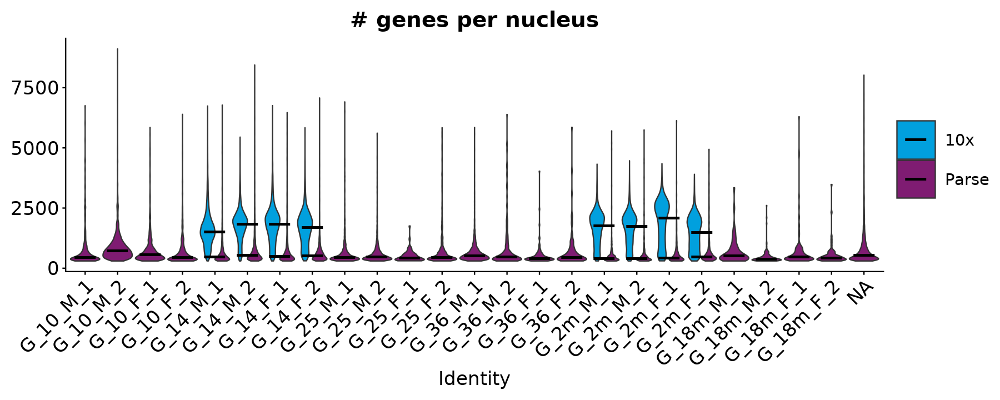

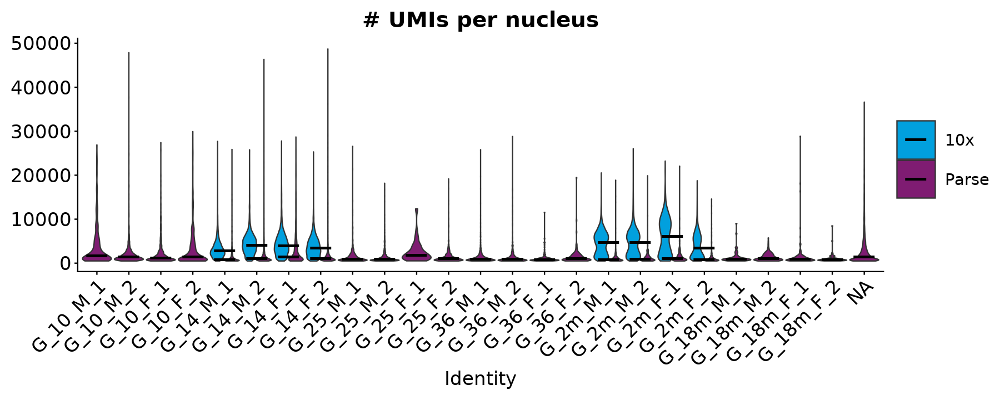

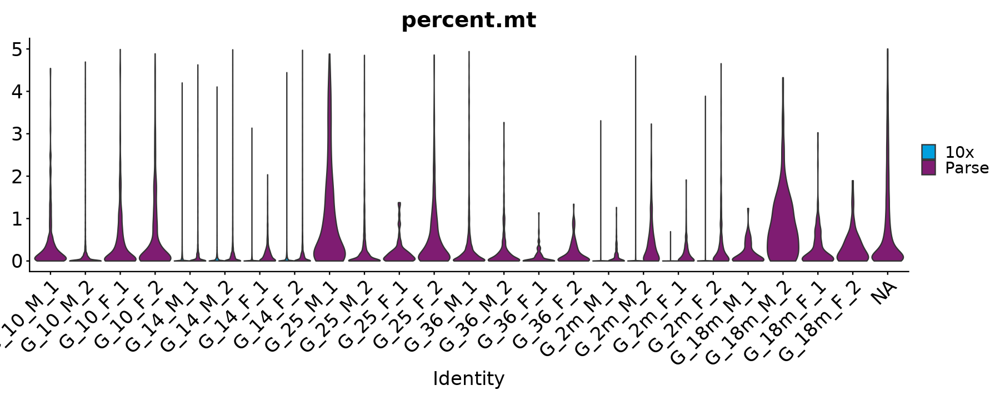

In [10]:
options(repr.plot.width = 15, repr.plot.height = 6)
p = VlnPlot(obj, features = c("nFeature_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample")+ ggtitle("# genes per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20),
              axis.text.x = element_text(size = 20),
              axis.text.y = element_text(size = 20))

p1 = VlnPlot(obj, features = c("nCount_RNA"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + ggtitle("# UMIs per nucleus") +
        scale_fill_manual(values = tech_cols) +
        stat_summary(fun.y = median, geom='point', size = 15, colour = "black", shape = 95) + 
        theme(text = element_text(size = 20), 
              axis.text.x = element_text(size = 20), 
              axis.text.y = element_text(size = 20))

p2 = VlnPlot(obj, features = c("percent.mt"), ncol = 1, split.by = "technology",
        pt.size = 0, group.by = "sample") + 
        scale_fill_manual(values = tech_cols) +
        theme(text = element_text(size = 20),
                axis.text.x = element_text(size = 20),
                axis.text.y = element_text(size = 20))
p
p1
p2

In [11]:
pdf(file="../../plots/qc/experiment_violinplots.pdf", width = 15, height = 6)
p
p1
p2
dev.off()

png 
  2

## UMAP "Feature Plots" of QC metadata

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



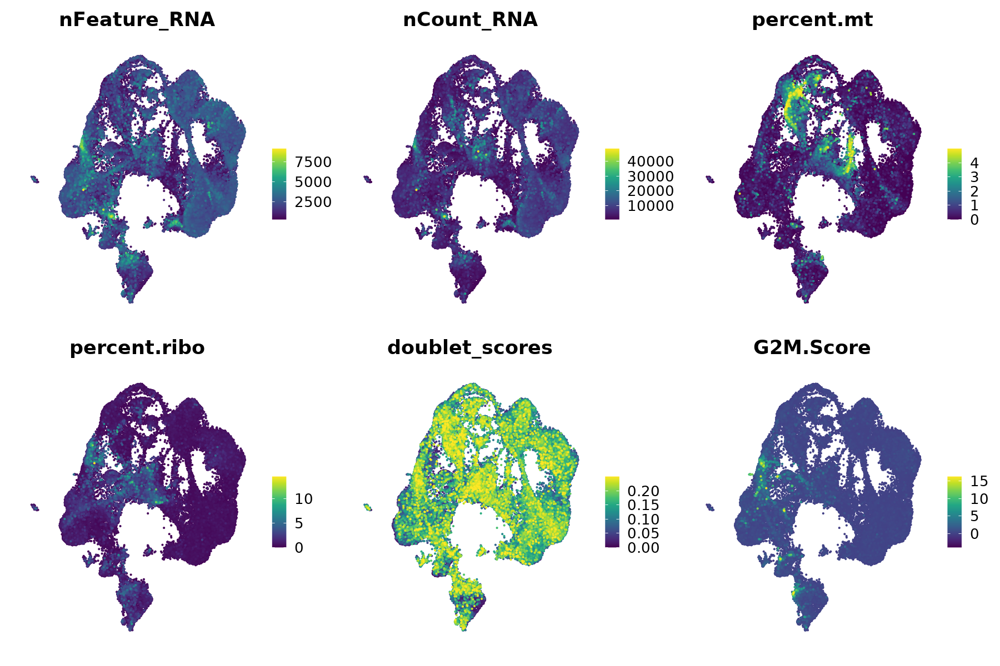

In [12]:
options(repr.plot.width = 15, repr.plot.height = 10)

featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))


In [13]:
pdf(file="../../plots/qc/qc_featureplot.png", width = 15, height = 10)
featureplot(obj,c("nFeature_RNA",
                        "nCount_RNA",
                        "percent.mt",
                        "percent.ribo",
                        "doublet_scores",
                        "G2M.Score"))
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

# Check integration and clustering

Warning message:
"ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


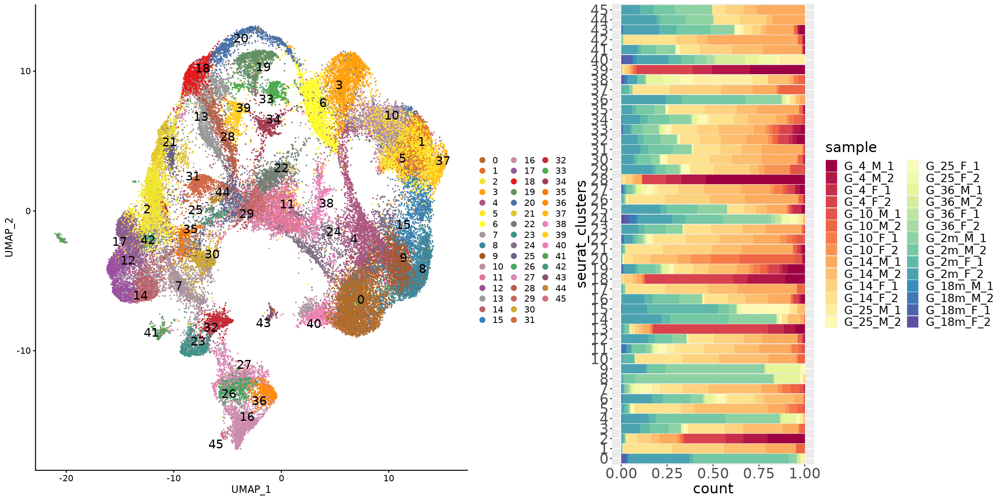

In [35]:
options(repr.plot.width = 20, repr.plot.height = 10)

p1=DimPlot(obj, reduction = "umap", label = TRUE, label.size=6,repel = TRUE, cols = cluster_cols)

p2=ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sample)) + geom_bar(position = "fill") +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), 
      axis.text.y = element_text(size = 20)) + scale_fill_manual(values = sample_cols) & coord_flip()
gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


In [36]:
pdf(file="../../plots/clustering/UMAP_cluster_sample_barplot.pdf",
    width = 20, height = 10)

gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


dev.off()

png 
  2

Warning message:
"ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


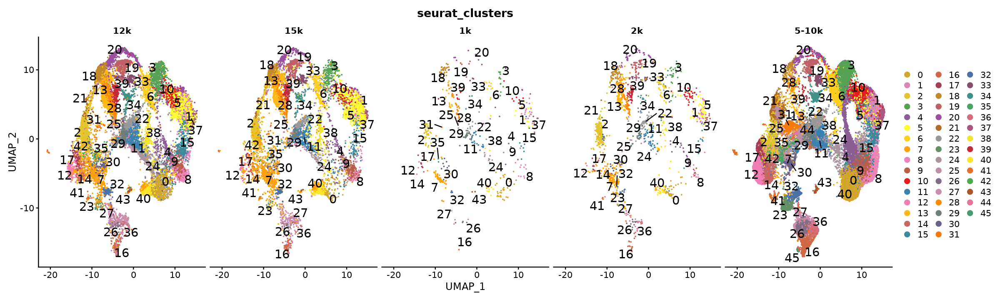

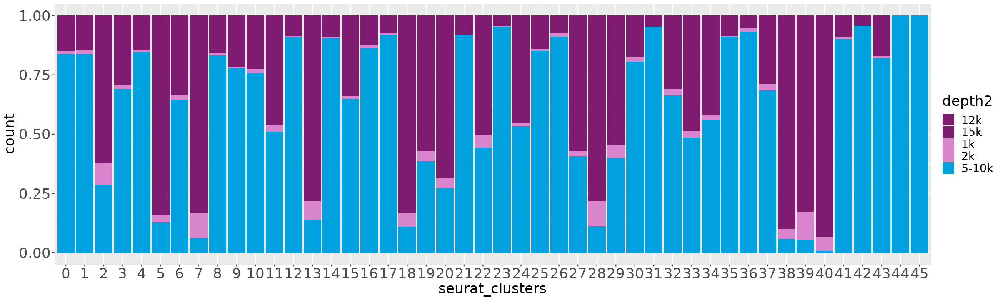

In [51]:
options(repr.plot.width = 20, repr.plot.height = 6)

p = DimPlot(obj, reduction = "umap", group.by = "seurat_clusters",
            split.by = "depth2", label = TRUE, 
            label.size = 6, repel = TRUE, cols = cluster_cols)
p1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=depth2)) + geom_bar(position = "fill") + 
    scale_fill_manual(values = depth2_cols) +
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20), 
          axis.text.y = element_text(size = 20))

p
p1

In [41]:
pdf(file="../../plots/clustering/Parse_10x_experiment_distribution.pdf",
    width = 20, height = 6)
p
p1
dev.off()

png 
  2

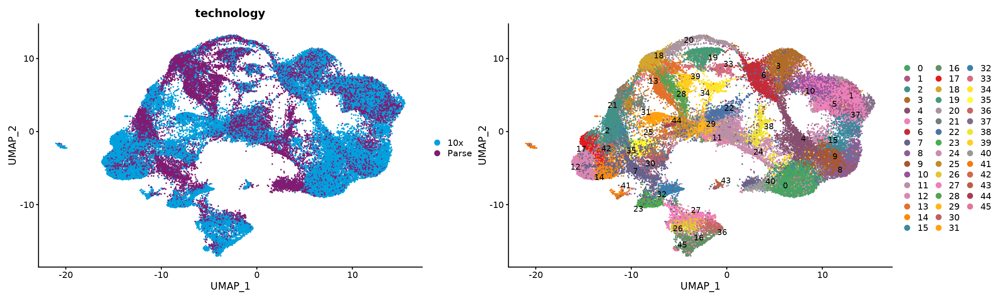

In [42]:
p1 = DimPlot(obj, reduction = "umap", group.by = "technology", shuffle = T) + scale_color_manual(values = tech_cols)
p2 = DimPlot(obj, reduction = "umap", label = TRUE, repel = TRUE, cols = cluster_cols)
p1 + p2

In [43]:
pdf(file="../../plots/clustering/UMAP_Parse_10x.pdf",
    width = 20, height = 8)
p1 + p2
dev.off()

png 
  2

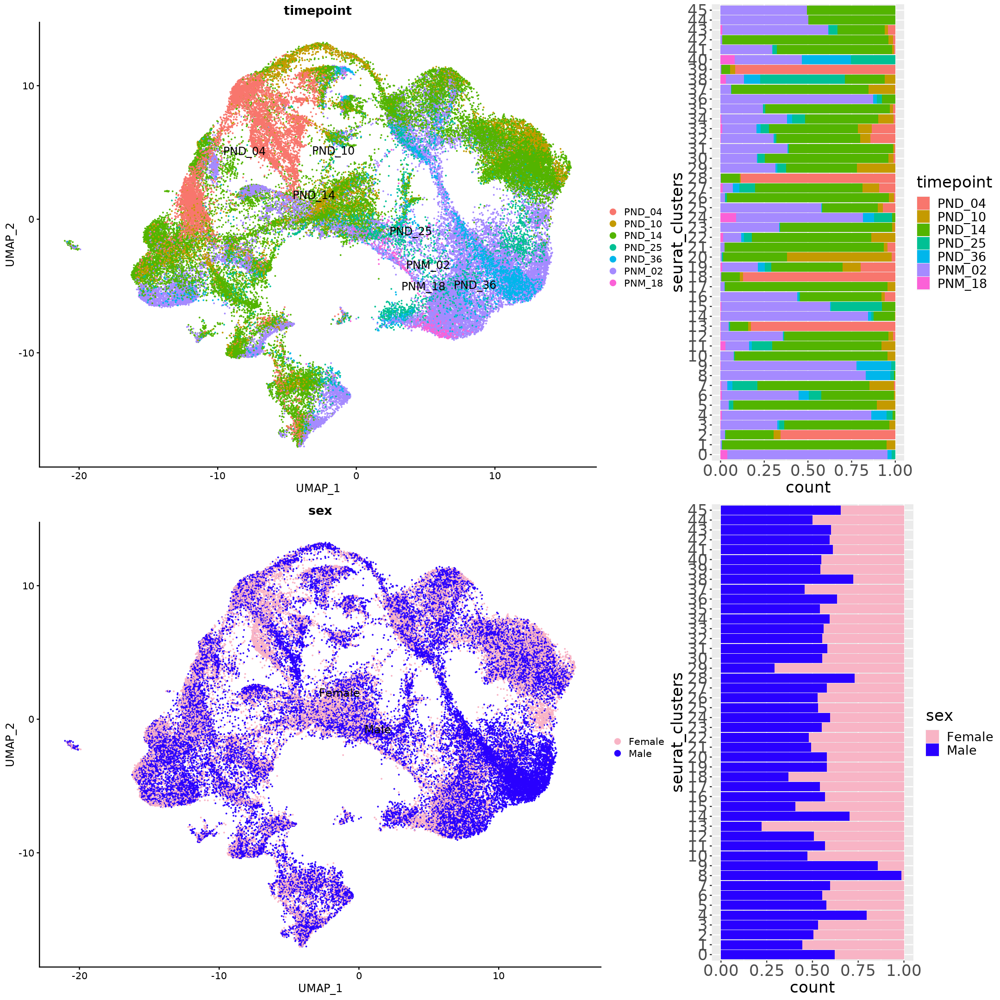

In [44]:
options(repr.plot.width = 18, repr.plot.height = 18)

p1 = DimPlot(obj, reduction = "umap", group.by = "timepoint", label = TRUE, label.size = 5, repel = TRUE)
p2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=timepoint)) + geom_bar(position = "fill") + 
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

p3 = DimPlot(obj, reduction = "umap", group.by = "sex", label = TRUE, label.size = 5, repel = TRUE, shuffle = T) + scale_color_manual(values = sex_cols)
p4 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=sex)) + geom_bar(position = "fill") + scale_fill_manual(values = sex_cols) +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))



In [45]:
pdf(file="../../plots/clustering/UMAP_age_sex_barplot.pdf",
    width = 18, height = 18)
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))

dev.off()

png 
  2

# Celltype annotation

### Check predictions

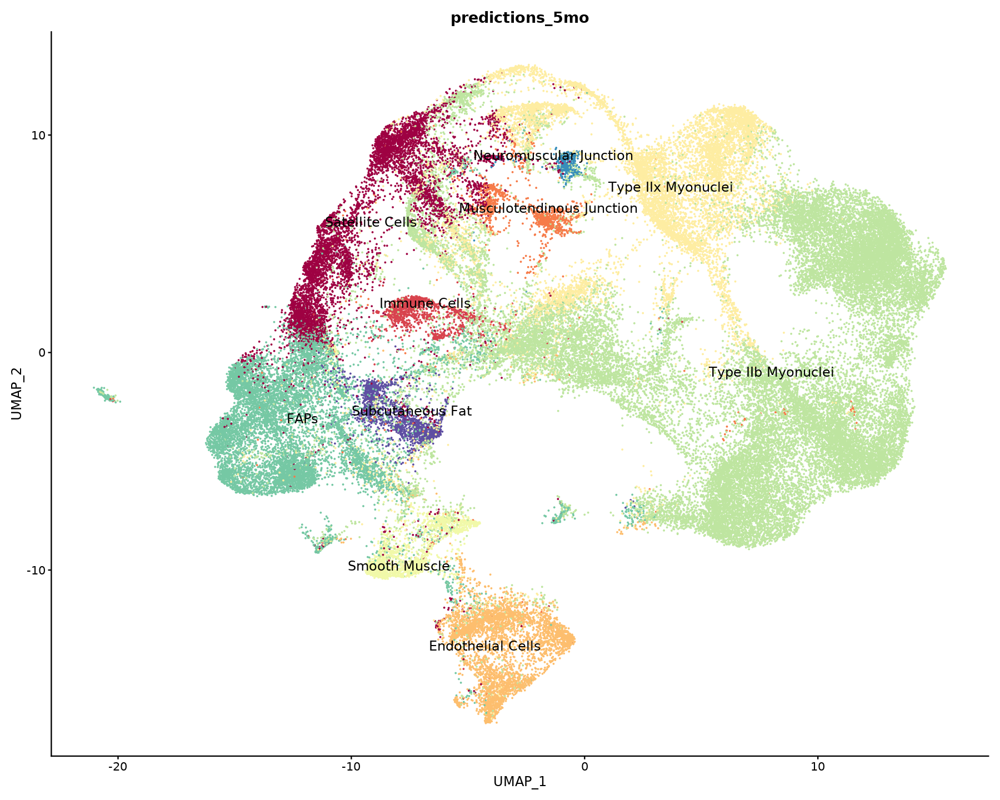

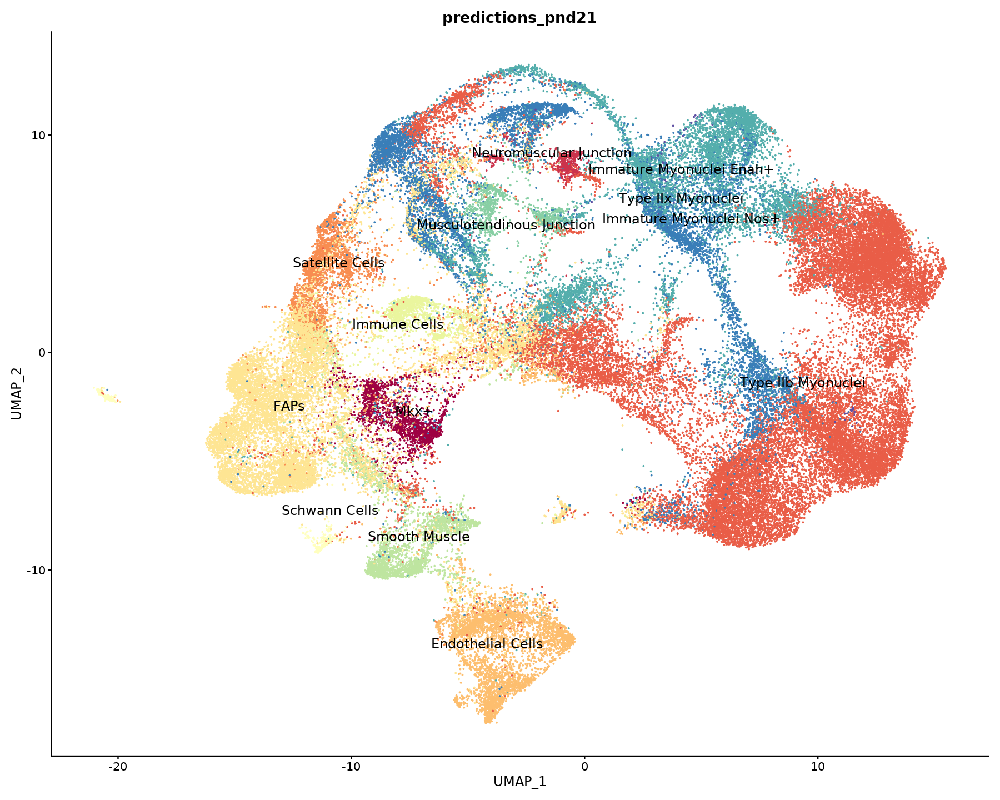

In [46]:
options(repr.plot.width = 15, repr.plot.height = 12)

cols = sample(spectral_cols(obj@meta.data,"predictions_5mo"))
umap1 = DimPlot(obj, reduction = "umap", group.by = "predictions_5mo", label = TRUE, 
                        label.size = 5, repel = TRUE) + 
    scale_color_manual(values = cols)

cols = sample(spectral_cols(obj@meta.data,"predictions_pnd21"))
umap2 = DimPlot(obj, reduction = "umap", group.by = "predictions_pnd21", label = TRUE, 
                        label.size = 5, repel = TRUE)+ 
    scale_color_manual(values = cols)

umap1 & NoLegend()
umap2 & NoLegend()



In [47]:
pdf(file="../../plots/annotation/UMAPs_predictions.pdf",
    width = 15, height = 12)
umap1 & NoLegend()
umap2 & NoLegend()
dev.off()


png 
  2

### Check marker gene expression

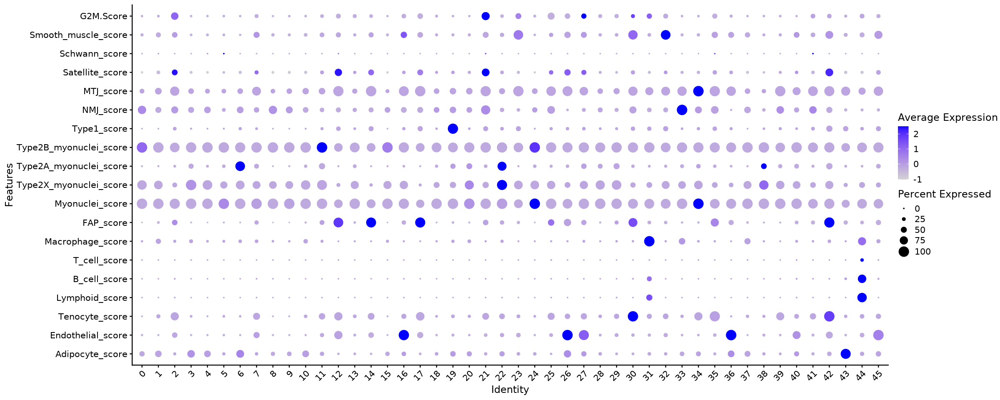

In [6]:
DefaultAssay(obj) = "SCT"
markers = read.csv("../../../ref/IGVF_curated_markers.csv")
markers = markers[markers$Tissue == markers_tissue,]
markers = markers[markers$Gene %in% rownames(obj),]

for (celltype in unique(markers$Subtype)){
    label = paste0(celltype,"_score")
    genes = unique(markers$Gene[markers$Subtype == celltype])
    obj[[label]] = PercentageFeatureSet(obj,features = genes)
    
}
options(repr.plot.width = 20, repr.plot.height= 8)
Idents(obj) = obj$seurat_clusters
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [49]:
pdf(file="../../plots/annotation/cluster_marker_dotplot.pdf",width = 24, height = 5)
p
dev.off()

png 
  2

## Sub-cluster

In [ ]:
DefaultAssay(obj) = "integrated"
Idents(obj) = obj$seurat_clusters
obj = FindSubCluster(obj,
                     cluster = "25", 
                     resolution = 0.1,
                     graph.name = "integrated_snn",
                     subcluster.name = "sub.cluster")


In [54]:
subcluster_cols = set1_cols(obj@meta.data,"sub.cluster")


In [55]:
options(repr.plot.width = 20, repr.plot.height = 10)

Idents(obj) = obj$sub.cluster
p1=DimPlot(obj, reduction = "umap", label = TRUE, label.size=6,repel = TRUE, cols = subcluster_cols)

p2=ggplot(obj@meta.data, aes(x=sub.cluster, fill=sample)) + geom_bar(position = "fill") +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), 
      axis.text.y = element_text(size = 20)) + scale_fill_manual(values = sample_cols) & coord_flip()
pdf(file="../../plots/clustering/UMAP_subcluster_sample_barplot.pdf",
    width = 20, height = 10)

gridExtra::grid.arrange(
  p1, p2,
  widths = c(2,1.5),
  layout_matrix = rbind(c(1, 2)))


dev.off()

options(repr.plot.width = 20, repr.plot.height = 6)

p = DimPlot(obj, reduction = "umap", group.by = "sub.cluster",
            split.by = "depth2", label = TRUE, 
            label.size = 6, repel = TRUE, cols = subcluster_cols)
p1 = ggplot(obj@meta.data, aes(x=sub.cluster, fill=depth2)) + geom_bar(position = "fill") + 
    scale_fill_manual(values = depth2_cols) +
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20), 
          axis.text.y = element_text(size = 20))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1))

pdf(file="../../plots/clustering/Parse_10x_experiment_distribution_subclusters.pdf",
    width = 20, height = 6)
p
p1
dev.off()

p1 = DimPlot(obj, reduction = "umap", group.by = "technology", shuffle = T) + scale_color_manual(values = tech_cols)
p2 = DimPlot(obj, reduction = "umap", label = TRUE, repel = TRUE, cols = subcluster_cols)

pdf(file="../../plots/clustering/UMAP_Parse_10x_subclusters.pdf",
    width = 20, height = 8)
p1 + p2
dev.off()

options(repr.plot.width = 18, repr.plot.height = 20)

p1 = DimPlot(obj, reduction = "umap", group.by = "timepoint", label = TRUE, label.size = 5, repel = TRUE)
p2 = ggplot(obj@meta.data, aes(x=sub.cluster, fill=timepoint)) + geom_bar(position = "fill") + 
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

p3 = DimPlot(obj, reduction = "umap", group.by = "sex", label = TRUE, label.size = 5, repel = TRUE, shuffle = T) + scale_color_manual(values = sex_cols)
p4 = ggplot(obj@meta.data, aes(x=sub.cluster, fill=sex)) + geom_bar(position = "fill") + scale_fill_manual(values = sex_cols) +
theme(text = element_text(size = 20), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) & coord_flip()

pdf(file="../../plots/clustering/UMAP_age_sex_barplot_subclusters.pdf",
    width = 18, height = 18)
gridExtra::grid.arrange(
  p1, p2, p3, p4,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                        c(3, 4)))

dev.off()





png 
  2

png 
  2

png 
  2

png 
  2

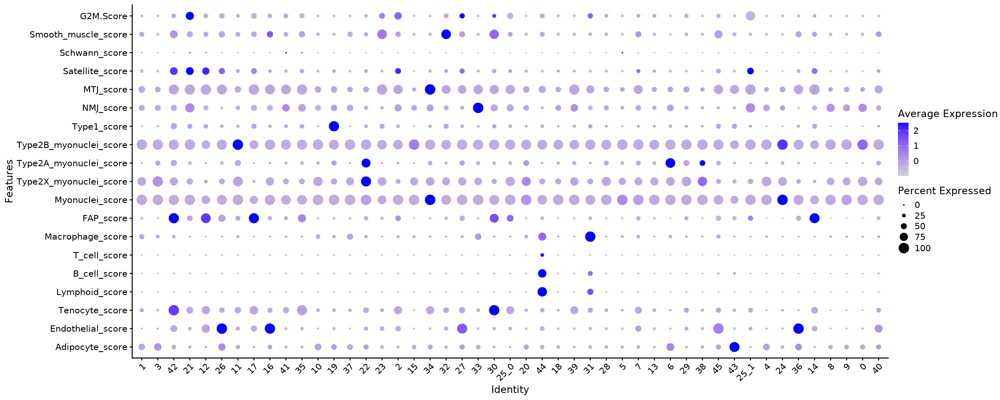

In [56]:
DefaultAssay(obj) = "SCT"
for (celltype in unique(markers$Subtype)){
    label = paste0(celltype,"_score")
    genes = unique(markers$Gene[markers$Subtype == celltype])
    obj[[label]] = PercentageFeatureSet(obj,features = genes)
    
}
options(repr.plot.width = 20, repr.plot.height= 8)
Idents(obj) = obj$sub.cluster
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [57]:
pdf(file="../../plots/annotation/subcluster_marker_dotplot.pdf",width = 24, height = 5)
p
dev.off()

png 
  2

## Order clusters

In [65]:
Idents(obj) = obj$sub.cluster
order = c(43, # adipo
          16,26,27,36,45, # endo
          30,35,42, # tenocyte
          44, # lymphoid
          31, # macrophage
          2,7,12,14,17, # FAP
          13,28,18, # perinatal
          3,20, # type2x
          6, # type2a
          10,0,4,8,9,15,1,5,37,24,11,40,38,22,29,"25_0", # type2b
          19, # type1
          33, # nmj
          34,39, # mtj
          21,"25_1", # satellite
          41, # schwann
          23,32 # smooth muscle
          )

Idents(obj) = factor(Idents(obj), levels = order)


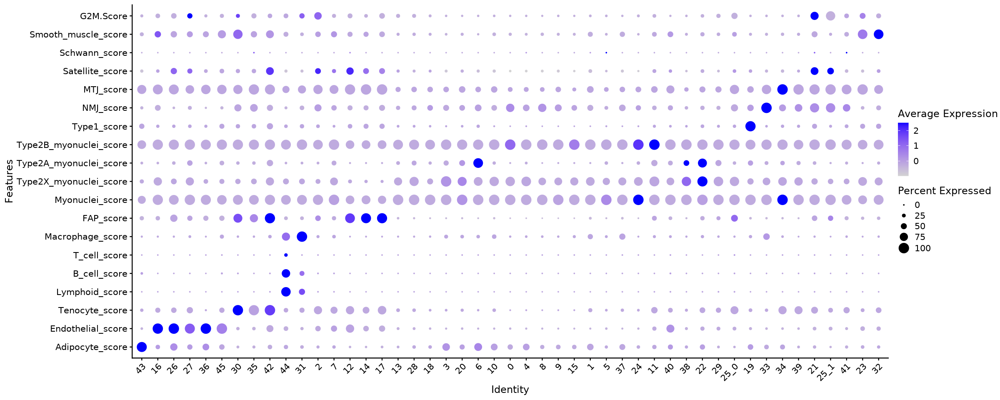

In [66]:
options(repr.plot.width = 20, repr.plot.height= 8)
p = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 
p

In [67]:
pdf(file="../../plots/annotation/subcluster_marker_dotplot_sorted.pdf",width = 24, height = 5)
p
dev.off()

png 
  2

## Name clusters

In [68]:
subtypes = c("Adipocyte", #43
              rep("Endothelial",5), #16,26,27,36,45,
              rep("Tenocyte",3), # 30,35,42,
              "Lymphocyte", #44
              "Macrophage", # 31
              rep("FAP",5), #2,7,12,14,17,
              rep("Perinatal",3), # 13,28,18,
              rep("Type2X_Myonuclei",2), # 3,20,
              "Type2A_Myonuclei", # 6
              rep("Type2B_Myonuclei",16), # 10,0,4,8,9,15,1,5,37,24,11,40,38,22,29,25_0,
              "Type1_Myonuclei", # 19
              "NMJ",
              rep("MTJ",2), #34,39,
              rep("Satellite",2), # 21,25_1,
              "Schwann", # 41
              rep("Smooth_muscle",2) #23,32
              )
names(subtypes) = levels(Idents(obj))
obj = RenameIdents(obj, subtypes)

order = c("Adipocyte",
          "Endothelial",
          "Tenocyte",
          "Lymphocyte",
          "Macrophage",
          "FAP",
          "Perinatal","Type2X_Myonuclei","Type2A_Myonuclei","Type2B_Myonuclei","Type1_Myonuclei",
          "NMJ","MTJ",
          "Satellite","Schwann","Smooth_muscle")
Idents(obj) = factor(Idents(obj), levels = order)
obj$subtypes = Idents(obj)

obj$celltypes = obj$subtypes
obj$celltypes = gsub("Type2X_Myonuclei","Myonuclei",obj$celltypes)
obj$celltypes = gsub("Type2A_Myonuclei","Myonuclei",obj$celltypes)
obj$celltypes = gsub("Type2B_Myonuclei","Myonuclei",obj$celltypes)
obj$celltypes = gsub("Type1_Myonuclei","Myonuclei",obj$celltypes)
obj$celltypes = gsub("Satellite","Myonuclei",obj$celltypes)
obj$celltypes = gsub("NMJ","Myonuclei",obj$celltypes)
obj$celltypes = gsub("MTJ","Myonuclei",obj$celltypes)
obj$celltypes = gsub("Perinatal","Myonuclei",obj$celltypes)

order = c("Adipocyte",
          "Endothelial",
          "Tenocyte",
          "Lymphocyte",
          "Macrophage",
          "FAP",
          "Myonuclei","Schwann","Smooth_muscle")
obj$celltypes = factor(obj$celltypes, levels = order)
table(obj$celltypes)

obj$gen_celltype = obj$celltypes
obj$gen_celltype = gsub("FAP","Stromal",obj$gen_celltype)
obj$gen_celltype = gsub("Lymphocyte","Immune",obj$gen_celltype)
obj$gen_celltype = gsub("Macrophage","Immune",obj$gen_celltype)

order = c("Adipocyte",
          "Endothelial",
          "Tenocyte",
          "Immune",
          "Stromal",
          "Myonuclei","Schwann","Smooth_muscle")
obj$gen_celltype = factor(obj$gen_celltype, levels = order)
table(obj$gen_celltype)


    Adipocyte   Endothelial      Tenocyte    Lymphocyte    Macrophage 
          272          4744          2338           152          1026 
          FAP     Myonuclei       Schwann Smooth_muscle 
        11041         47535           551          2220 


    Adipocyte   Endothelial      Tenocyte        Immune       Stromal 
          272          4744          2338          1178         11041 
    Myonuclei       Schwann Smooth_muscle 
        47535           551          2220 

## Update metadata for integration with other ENCODE data
submission_celltype, cell_type_mnemonic, CL_ID_annotation

In [73]:
obj$submission_celltype  = obj$subtypes
obj$submission_celltype = gsub("Adipocyte","adipocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Endothelial","endothelial cell",obj$submission_celltype)
obj$submission_celltype = gsub("Tenocyte","tenocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Lymphocyte","lymphocyte",obj$submission_celltype)
obj$submission_celltype = gsub("Macrophage","macrophage",obj$submission_celltype)
obj$submission_celltype = gsub("FAP","fibroadipogenic progenitor cell",obj$submission_celltype)
obj$submission_celltype = gsub("Perinatal","perinatal muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("Type1_Myonuclei","type 1 muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("Type2X_Myonuclei","type 2X muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("Type2A_Myonuclei","type 2A muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("Type2B_Myonuclei","type 2B muscle cell",obj$submission_celltype)
obj$submission_celltype = gsub("NMJ","neuromuscular junction nucleus",obj$submission_celltype)
obj$submission_celltype = gsub("MTJ","myotendinous junction nucleus",obj$submission_celltype)
obj$submission_celltype = gsub("Satellite","muscle satellite cell",obj$submission_celltype)
obj$submission_celltype = gsub("Schwann","Schwann cell",obj$submission_celltype)
obj$submission_celltype = gsub("Smooth_muscle","smooth muscle cell",obj$submission_celltype)

table(obj$submission_celltype)

obj$cell_type_mnemonic  = obj$submission_celltype
obj$cell_type_mnemonic = gsub("\\<adipocyte\\>","ADIP_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<endothelial cell\\>","ENDO_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<tenocyte\\>","TENO_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<lymphocyte\\>","LYMPC_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<macrophage\\>","MACRO_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<fibroadipogenic progenitor cell\\>","FADIP_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<perinatal muscle cell\\>","PNATL_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<type 1 muscle cell\\>","T1_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<type 2X muscle cell\\>","T2X_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<type 2A muscle cell\\>","T2A_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<type 2B muscle cell\\>","T2B_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<neuromuscular junction nucleus\\>","NMJ_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<myotendinous junction nucleus\\>","MTJ_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<muscle satellite cell\\>","SATL_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<Schwann cell\\>","SCHWN_SKMU",obj$cell_type_mnemonic)
obj$cell_type_mnemonic = gsub("\\<smooth muscle cell\\>","SMC_SKMU",obj$cell_type_mnemonic)

table(obj$cell_type_mnemonic)

obj$CL_ID_annotation  = obj$cell_type_mnemonic
obj$CL_ID_annotation = gsub("ADIP_SKMU","CL:0000136",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("ENDO_SKMU","CL:0000115",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("TENO_SKMU","CL:0000388",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("LYMPC_SKMU","CL:0000542",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("MACRO_SKMU","CL:0000235",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("FADIP_SKMU","CL:0009099",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("PNATL_SKMU","CL:0000188",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("T1_SKMU","CL:0002211",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("T2X_SKMU","CL:0002212",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("T2A_SKMU","CL:0002214",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("T2B_SKMU","CL:0002215",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("NMJ_SKMU","CL:0000188",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("MTJ_SKMU","CL:0000188",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("SATL_SKMU","CL:0000188",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("SCHWN_SKMU","CL:0002573",obj$CL_ID_annotation)
obj$CL_ID_annotation = gsub("SMC_SKMU","CL:0000192",obj$CL_ID_annotation)

table(obj$CL_ID_annotation)

obj$synapse = synapse_id
obj$tissue_mnemonic = enc_abrv



                   Schwann cell                       adipocyte 
                            551                             272 
               endothelial cell fibroadipogenic progenitor cell 
                           4744                           11041 
                     lymphocyte                      macrophage 
                            152                            1026 
          muscle satellite cell   myotendinous junction nucleus 
                           1704                            1463 
 neuromuscular junction nucleus           perinatal muscle cell 
                            895                            4392 
             smooth muscle cell                        tenocyte 
                           2220                            2338 
             type 1 muscle cell             type 2A muscle cell 
                           1416                            2567 
            type 2B muscle cell             type 2X muscle cell 
                        


 ADIP_SKMU  ENDO_SKMU FADIP_SKMU LYMPC_SKMU MACRO_SKMU   MTJ_SKMU   NMJ_SKMU 
       272       4744      11041        152       1026       1463        895 
PNATL_SKMU  SATL_SKMU SCHWN_SKMU   SMC_SKMU    T1_SKMU   T2A_SKMU   T2B_SKMU 
      4392       1704        551       2220       1416       2567      30897 
  T2X_SKMU  TENO_SKMU 
      4201       2338 


 CL:0000115  CL:0000136  CL:0000188  CL:0000192  CL:0000235  CL:0000388 
       4744         272        8454        2220        1026        2338 
 CL:0000542  CL:0002211  CL:0002212  CL:0002214  CL:0002215  CL:0002573 
        152        1416        4201        2567       30897         551 
FCL:0000136 
      11041 

# Annotated plots

In [74]:
subtype_cols = annot_cols[match(levels(obj$subtypes),annot_cols$subtypes),"subtype_color"]
celltype_cols = annot_cols[match(levels(obj$celltypes),annot_cols$celltypes),"celltype_color"]
gen_celltype_cols = annot_cols[match(levels(obj$gen_celltype),annot_cols$gen_celltype),"gen_celltype_color"]

Warning message:
"ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


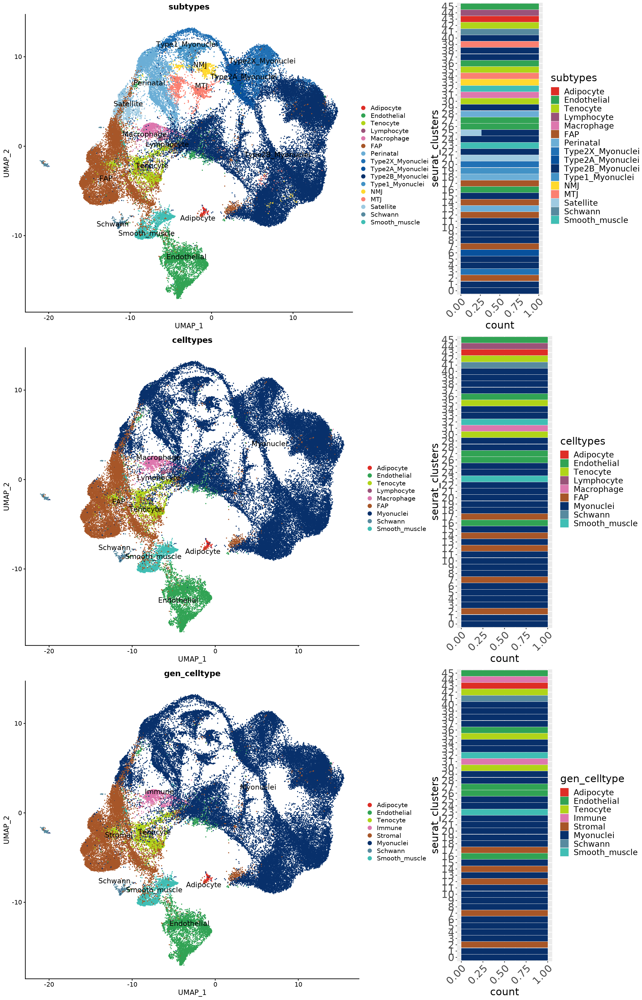

In [75]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap_subtypes = DimPlot(obj, reduction = "umap", group.by = "subtypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = subtype_cols)
cluster_subtypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=subtypes)) + 
    scale_fill_manual(values = subtype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


umap_celltypes = DimPlot(obj, reduction = "umap", group.by = "celltypes", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = celltype_cols)
cluster_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=celltypes)) + 
    scale_fill_manual(values = celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap_gen_celltypes = DimPlot(obj, reduction = "umap", group.by = "gen_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) + scale_color_manual(values = gen_celltype_cols)
cluster_gen_celltypes = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=gen_celltype)) + 
    scale_fill_manual(values = gen_celltype_cols) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [76]:
pdf(file="../../plots/annotation/UMAPs_barplots.pdf",width = 18,height=28)

gridExtra::grid.arrange(
    umap_subtypes, cluster_subtypes,
    umap_celltypes, cluster_celltypes,
    umap_gen_celltypes, cluster_gen_celltypes,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))

dev.off()

png 
  2

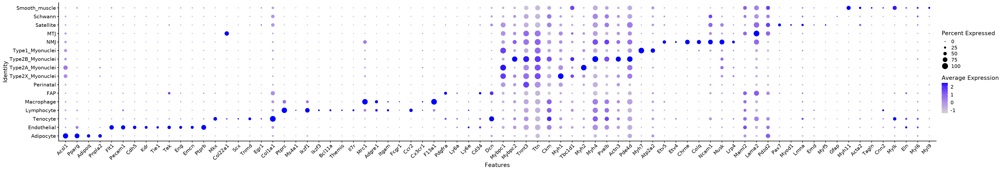

In [88]:
options(repr.plot.width = 35, repr.plot.height = 6)

Idents(obj) = obj$subtypes
p = DotPlot(obj, features =  unique(markers$Gene)) + 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) 
p


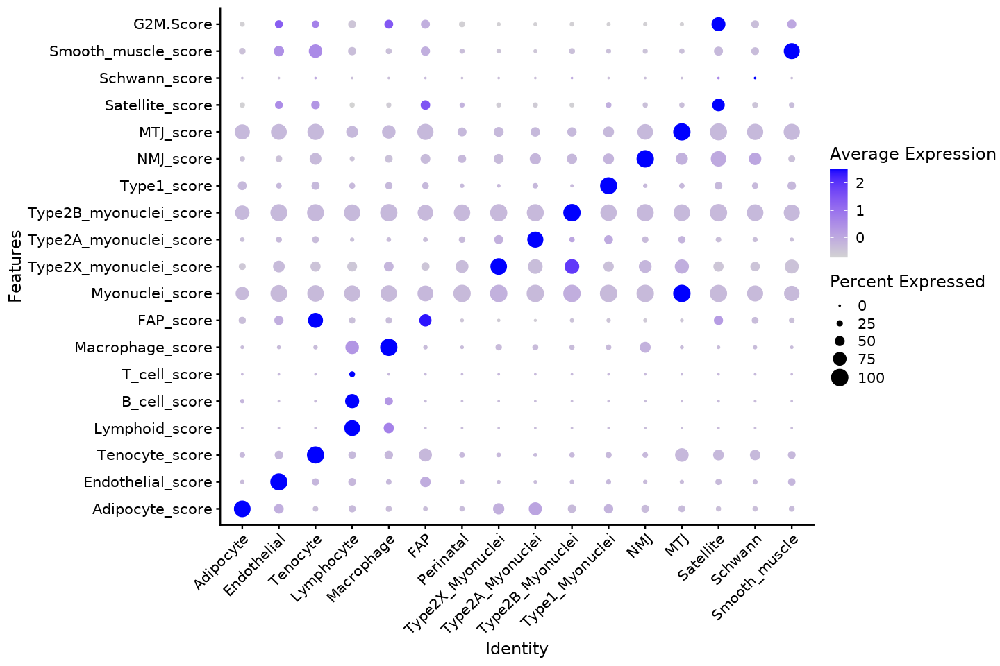

In [78]:
options(repr.plot.width = 12, repr.plot.height = 8)

p1 = DotPlot(obj, features =  c(paste0(unique(markers$Subtype),"_score"),"G2M.Score"))+ 
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) & coord_flip() 

p1


In [89]:
pdf(file="../../plots/annotation/subtypes_marker_dotplot.pdf",width = 35, height = 6)
p
dev.off()

png 
  2

In [80]:
pdf(file="../../plots/annotation/subtypes_marker_score_dotplot.pdf",width = 12, height = 8)
p1
dev.off()

png 
  2

Warning message:
"ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


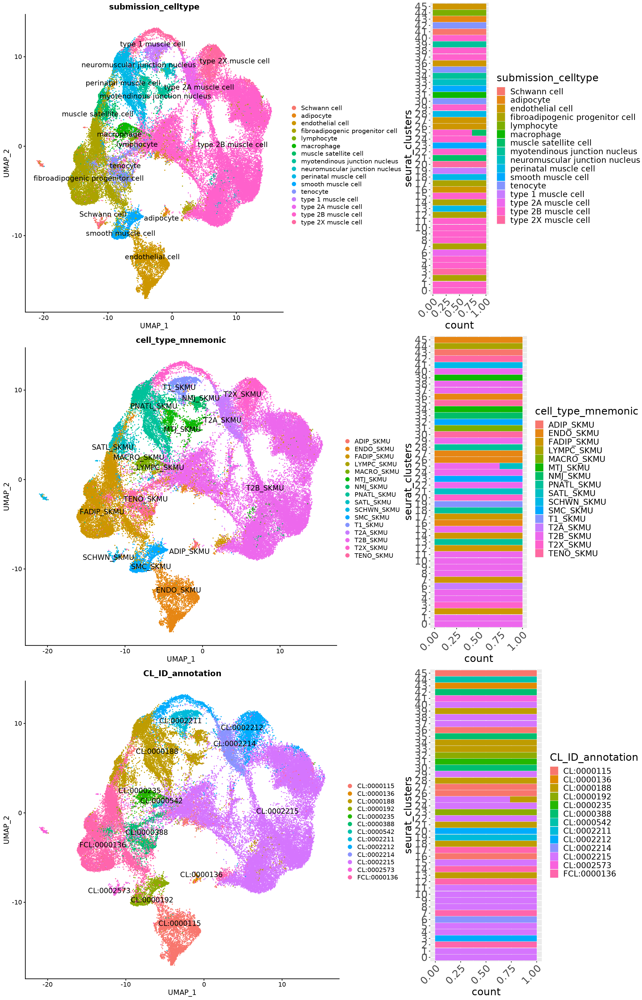

In [81]:
options(repr.plot.width = 18, repr.plot.height = 28)

umap1 = DimPlot(obj, reduction = "umap", group.by = "submission_celltype", label = TRUE, 
                        label.size = 5, repel = TRUE) #& NoLegend()
cluster1 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=submission_celltype)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()#& NoLegend()


umap2 = DimPlot(obj, reduction = "umap", group.by = "cell_type_mnemonic", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster2 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=cell_type_mnemonic)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()

umap3 = DimPlot(obj, reduction = "umap", group.by = "CL_ID_annotation", label = TRUE, 
                        label.size = 5, repel = TRUE)
cluster3 = ggplot(obj@meta.data, aes(x=seurat_clusters, fill=CL_ID_annotation)) + geom_bar(position = "fill") + 
    theme(text = element_text(size = 20), 
          axis.text.x = element_text(size = 20,angle = 45, hjust = 1), 
          axis.text.y = element_text(size = 20)) & coord_flip()


gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1.2),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))


In [82]:
pdf(file="../../plots/annotation/UMAPs_barplots_submissions.pdf",
    width = 15, height = 10)
gridExtra::grid.arrange(
    umap1, cluster1,
    umap2, cluster2,
    umap3, cluster3,
  widths = c(2,1),
  layout_matrix = rbind(c(1, 2),
                       c(3, 4),
                       c(5, 6)))
dev.off()


png 
  2

## Get ENC dataset (experiment_accession) from enc4_mouse_metadata_fixed.csv

In [83]:
expt_acc = read.csv("../../../ref/enc4_mouse_metadata_fixed.csv")
expt_acc = expt_acc[,c("sublibrary_sample","experiment_accession")]

In [84]:
seurat_metadata = obj@meta.data
seurat_metadata$experiment_accession = NULL

In [85]:
seurat_metadata = left_join(seurat_metadata,expt_acc,by="sublibrary_sample")

In [86]:
obj$rna_experiment_accession = seurat_metadata$experiment_accession

In [87]:
table(obj$rna_experiment_accession)


ENCSR019BZL ENCSR021MHR ENCSR026VDA ENCSR047KXM ENCSR083EPD ENCSR094YHS 
        192        5327          21         594          10         158 
ENCSR125XUV ENCSR137UJM ENCSR138QIF ENCSR150KKS ENCSR160AKB ENCSR161BNJ 
       6751         140          88         168         306          14 
ENCSR163GJZ ENCSR182SMX ENCSR187HKH ENCSR188GDL ENCSR231VJO ENCSR253YLA 
       5699         106           6        1941          60         470 
ENCSR279GBC ENCSR305VTL ENCSR328JOY ENCSR355CTS ENCSR358NKP ENCSR399TQO 
         59          22        1006        2307          61         150 
ENCSR419OCT ENCSR425UJQ ENCSR438FRT ENCSR459ESG ENCSR462NDO ENCSR478PUL 
         83          11        6086        1060        1242        5714 
ENCSR480RWU ENCSR488XVC ENCSR496OYJ ENCSR498SXJ ENCSR514XCG ENCSR548JRH 
         52         216          25        1705          39           5 
ENCSR554FGW ENCSR576UHY ENCSR577OFZ ENCSR580UNE ENCSR581NLU ENCSR627PLH 
       1029         466         585         616   

# Save

In [98]:
saveRDS(obj,file=paste0("../../seurat/",tissue,"_Parse_10x_integrated.rds"))


In [90]:
write.csv(obj@meta.data,file=paste0("../../seurat/",str_to_lower(tissue),"_Parse_10x_integrated_metadata.csv"))



In [91]:
obj_parse = subset(obj, subset = technology == "Parse")
saveRDS(obj_parse, file = paste0("../../seurat/",tissue,"_Parse.rds"))

obj_10x = subset(obj, subset = technology == "10x")
saveRDS(obj_10x, file = paste0("../../seurat/",tissue,"_10x.rds"))


In [92]:
write.csv(obj_parse@meta.data, file=paste0("../../seurat/",tissue,"_Parse_metadata.csv"))

write.csv(obj_10x@meta.data, file=paste0("../../seurat/",tissue,"_10x_metadata.csv"))



# Subset for regulatory genes & save matrices for input into Topyfic

In [93]:
reg_genes = read.csv("../../../ref/gene_display_table_expressed_7categories.csv")

In [94]:
table(reg_genes$gene_name %in% rownames(obj@assays$RNA@counts))


TRUE 
2701 

In [95]:
mtx_parse = obj_parse@assays$RNA@counts
mtx_parse = mtx_parse[rownames(mtx_parse) %in% reg_genes$gene_name, ]
mtx_parse = mtx_parse[match(reg_genes$gene_name, rownames(mtx_parse)), ]

mtx_10x = obj_10x@assays$RNA@counts
mtx_10x = mtx_10x[rownames(mtx_10x) %in% reg_genes$gene_name, ]
mtx_10x = mtx_10x[match(reg_genes$gene_name, rownames(mtx_10x)), ]

In [96]:
table(rownames(mtx_parse) == reg_genes$gene_name)
table(rownames(mtx_10x) == reg_genes$gene_name)


TRUE 
2701 


TRUE 
2701 

In [97]:
writeMM(mtx_parse, file=paste0("../../seurat/",tissue,"_Parse.mtx"))

writeMM(mtx_10x, file=paste0("../../seurat/",tissue,"_10x.mtx"))



NULL

NULL